In [4]:
# import all relevant libraries 
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt 
import plotly.express as px 
sb.set() # set the default Seaborn style for graphics
import statsmodels.graphics.mosaicplot as sp
import plotly.graph_objects as go

# Import essential models and functions from sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

#to import this to print our photos as github is unable to run our plots
from IPython.display import Image

In [8]:
# import the dataset 
anemiaData = pd.read_csv('anemia.csv')
anemiaData.head(10)

anemiaData.rename(columns={'Age in 5-year groups': 'age',
                   'Type of place of residence': 'residence',
                   'Highest educational level': 'highest_education',
                   'Wealth index combined': 'wealth_index',
                   'Births in last five years': 'births_last5_years',
                   'Age of respondent at 1st birth': 'age_respondent_1st_birth',
                   'Hemoglobin level adjusted for altitude and smoking (g/dl - 1 decimal)': 'hemoglobin_altitude_smoking',
                   'Anemia level': 'mother_anemia_level',
                   'Have mosquito bed net for sleeping (from household questionnaire)': 'mosquito_bed_sleeping',
                   'Smokes cigarettes': 'smoking',
                   'Current marital status': 'status',
                   'Currently residing with husband/partner': 'residing_husband_partner',
                   'When child put to breast': 'child_put_breast',
                   'Had fever in last two weeks': 'fever_two_weeks',
                   'Hemoglobin level adjusted for altitude (g/dl - 1 decimal)': 'hemoglobin_altitude',
                   'Anemia level.1': 'child_anemia_level',
                   'Taking iron pills, sprinkles or syrup': 'iron_pills'}, inplace=True)
anemiaData.head()

#Using Child Anemia Level as the base frame - only include rows with child anemia level indicator
# Filter rows where 'anemia_level_child' column is not null
anemiaData.dropna(subset=['child_anemia_level'],inplace = True)
#Rows and Columns in Data Frame
anemiaData.shape

#Checking to see remaining rows with NULL values
anemiaData.isnull().sum()

#Filling the NULL value of mother_anemia_level
anemiaData['mother_anemia_level'] = anemiaData['mother_anemia_level'].fillna("Not stated")

#Filling the NULL value of residing_husband_partner
anemiaData['residing_husband_partner'] = anemiaData['residing_husband_partner'].fillna("Not stated")

hemoglobin = pd.DataFrame(anemiaData['hemoglobin_altitude_smoking'])
child_level = pd.DataFrame(anemiaData['child_anemia_level'])
# to do: need to deal with NaN values 
mean_value = anemiaData['hemoglobin_altitude_smoking'].mean()
anemiaData['hemoglobin_altitude_smoking'].fillna(mean_value, inplace = True)

anemiaData.drop('child_put_breast',axis =1, inplace = True)

anemiaData.shape
anemiaData.isnull().sum()

anemiaData.drop('smoking',axis =1, inplace = True)
anemiaData.drop('status', axis=1, inplace = True)

# Exploratory Data Visualisation
## DISCLAIMER: As github does not support plotly, in order to interact with our graphs to get the exact figures, this file would need to be passed into Jupyter Nbviewer.
### In this section, we will use several data visualization methods to understand the relationships between various variable. More specifically, to allow us to identify the key factors affecting a child's anemia level. We will first experiment with the distributions of the different variables. First, let's see how residence may affect child anemia levels

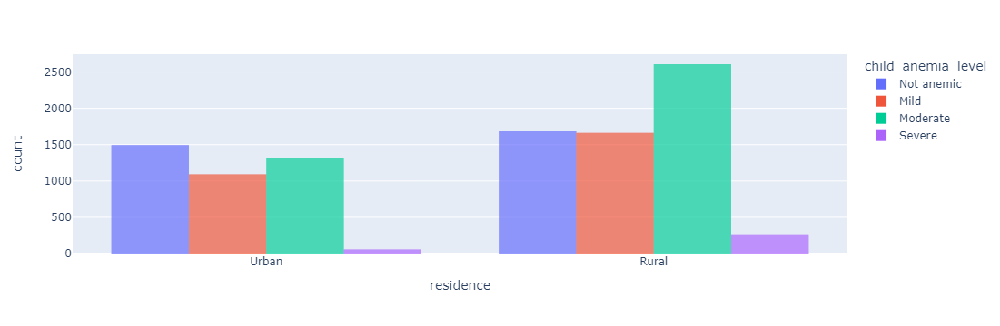

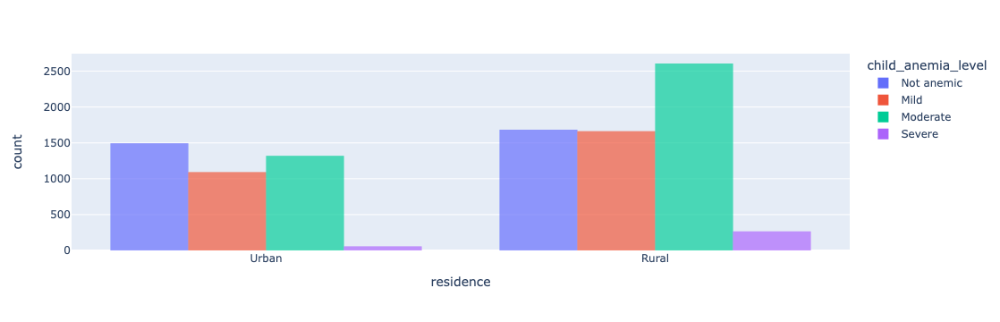

In [31]:
##Using a bar Chart to display the count of different anemia levels, belonging to different residential areas
fig2 = px.bar(anemiaData, x="residence", color = "child_anemia_level", barmode = "group")
fig2.update_traces(dict(marker_line_width=0))
fig2.show()
Image(filename = '/Users/winnie/Downloads/Residence_CA.png')

### Let's take a look at residence and its relation with child anemia levels using a sunburst chart¶

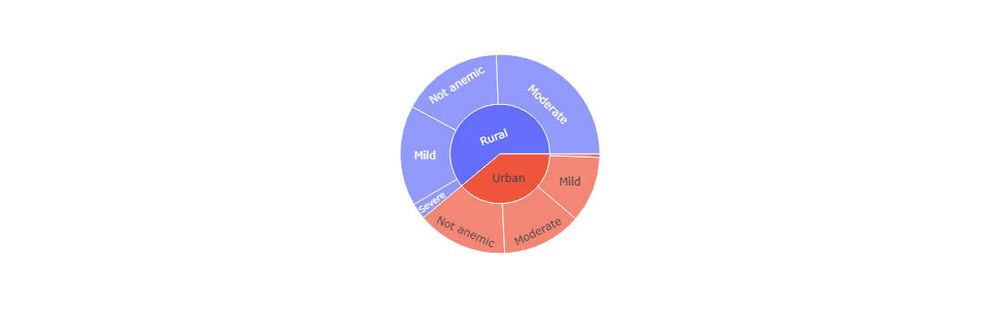

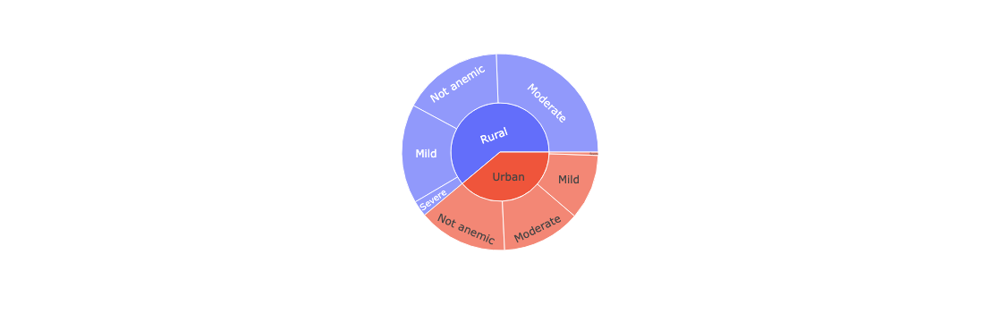

In [32]:
import warnings
# Suppress FutureWarning
warnings.simplefilter(action='ignore', category=FutureWarning) ## to remove warning

valuesAL = anemiaData.groupby(['residence', 'child_anemia_level'], observed=False).size().reset_index(name='count')
fig3 = px.sunburst(valuesAL, path=['residence', 'child_anemia_level'], values='count')
fig3.show()
Image(filename = '/Users/winnie/Downloads/Residence_sunburts.png')

#### We can deduce that in both urban and rural areas, there are very few severe cases as compared to the other levels. However, in rural areas, children with moderate anemia levels is more prominent as compared to urban areas where the cases are generally equally spread out

In [33]:
hemoglobin = pd.DataFrame(anemiaData['hemoglobin_altitude_smoking'])
child_level = pd.DataFrame(anemiaData['child_anemia_level'])
# to do: need to deal with NaN values 
mean_value = anemiaData['hemoglobin_altitude_smoking'].mean()
anemiaData['hemoglobin_altitude_smoking'].fillna(mean_value, inplace = True)

## Let's take a look at how hemoglobin levels affect anemia levels
#### We will explore using violin plots

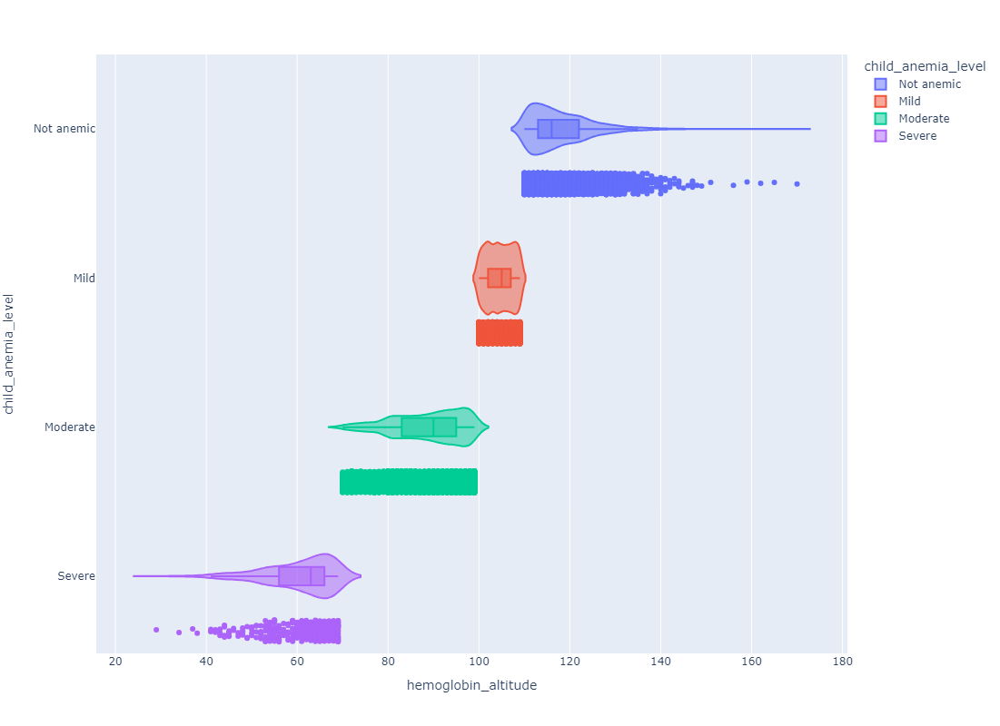

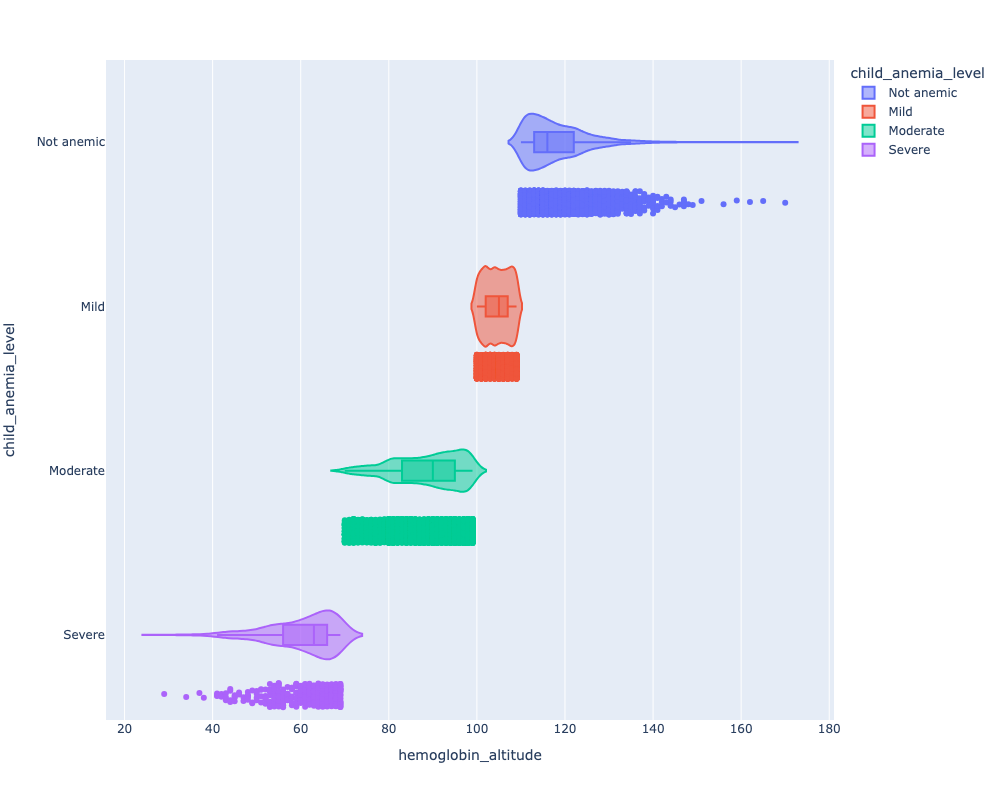

In [34]:
fig = px.violin(anemiaData, y="child_anemia_level", x="hemoglobin_altitude", color="child_anemia_level", box=True, points="all", hover_data=anemiaData.columns)

fig.update_layout(
    height=800,  # Set the height of the figure
    width=1000    # Set the width of the figure
)

fig.show()
Image(filename = '/Users/winnie/Downloads/Hemoglobin_Violin.png')

#### From this, we can tell that those with higher hemoglobin_altitudes have lower anemic levels.
## Now, let's look at smoking adjusted hemoglobin levels

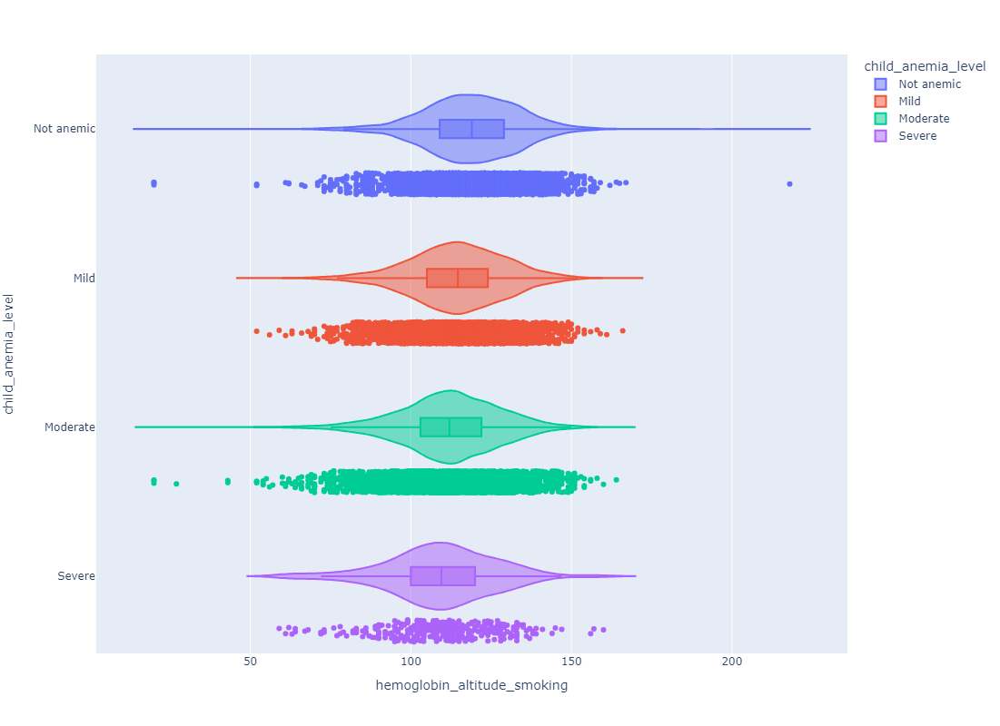

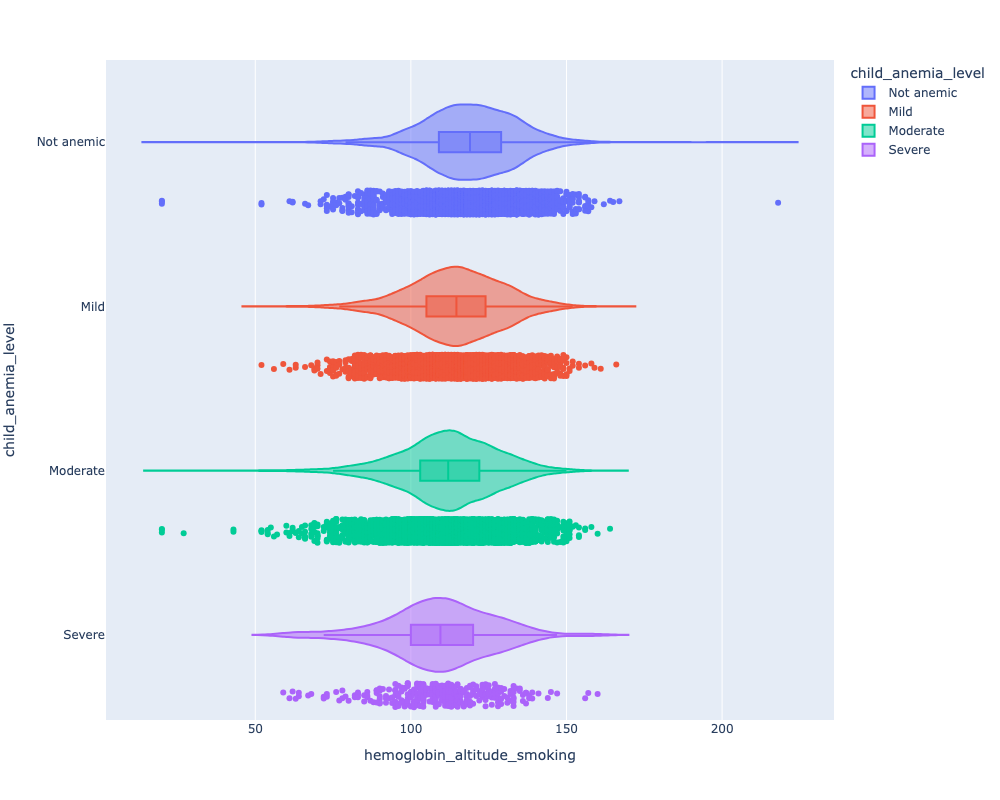

In [35]:
fig = px.violin(anemiaData, y="child_anemia_level", x="hemoglobin_altitude_smoking", color="child_anemia_level", box=True, points="all", hover_data=anemiaData.columns)

fig.update_layout(
    height=800,  # Set the height of the figure
    width=1000    # Set the width of the figure
)

fig.show()
Image(filename = '/Users/winnie/Downloads/Smoking_Hemoglobin.png')

## Now, let's explore using box plots

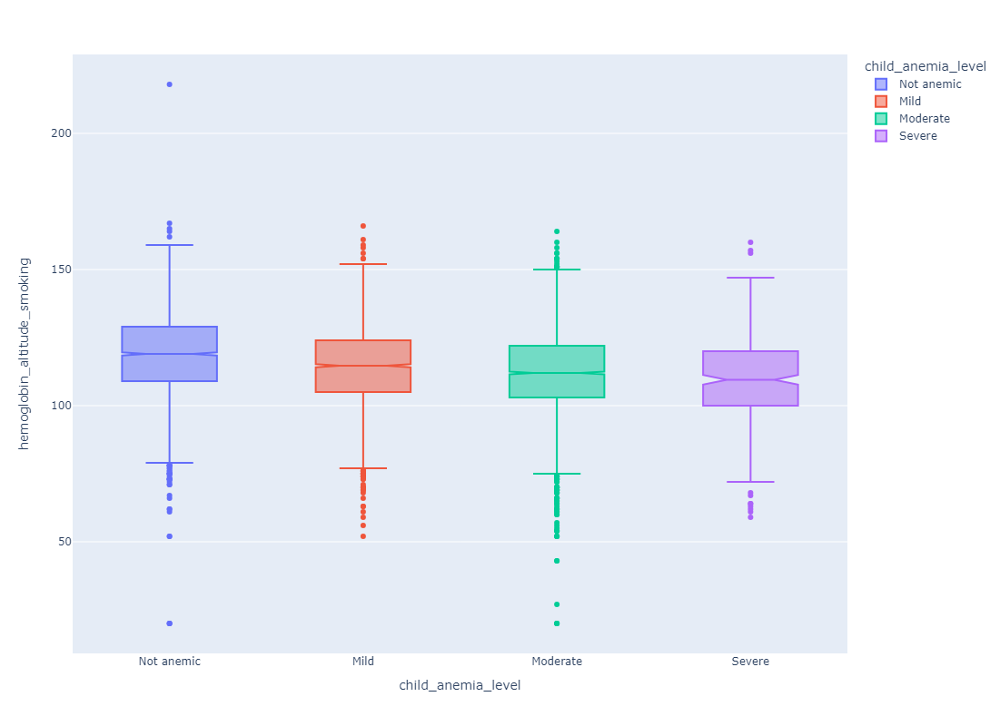

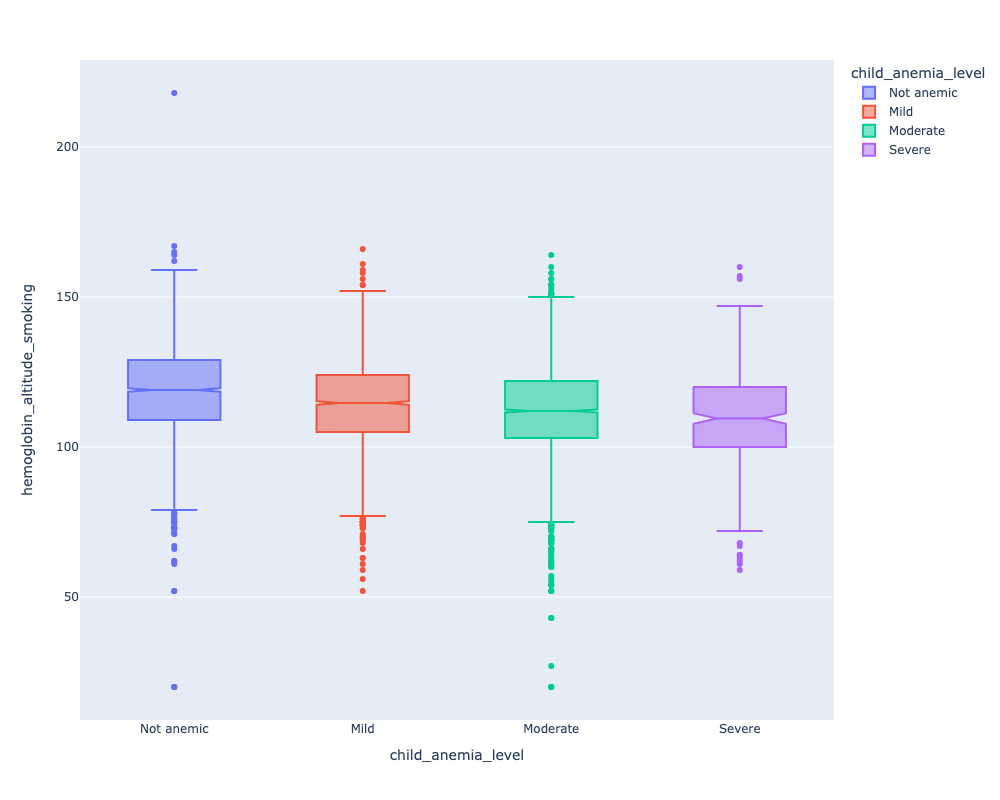

In [36]:
fig = px.box(anemiaData, x="child_anemia_level", y="hemoglobin_altitude_smoking", color="child_anemia_level", notched=True)
fig.update_layout(
    height=800,  # Set the height of the figure
    width=1000    # Set the width of the figure
)
fig.show()
Image(filename = '/Users/winnie/Downloads/hemoglobin_box.png')

### We can see that the box plots and violin plots are very similar, and for both, we can see that with lower hemoglobin levels comes lower anemia levels, possibly indicating that one's hemoglobin level may affect their anemia level 


#### Overall, let's plot out the cat plots of the different categorical variables and the child's anemia level, allowing us to see if there is any evident relationships at first glance 

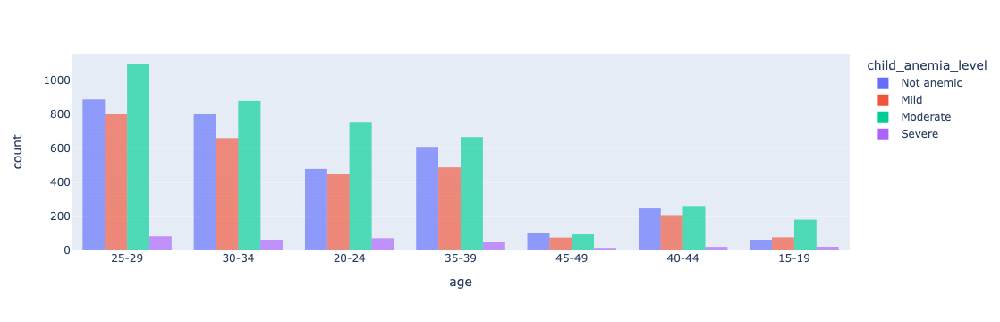

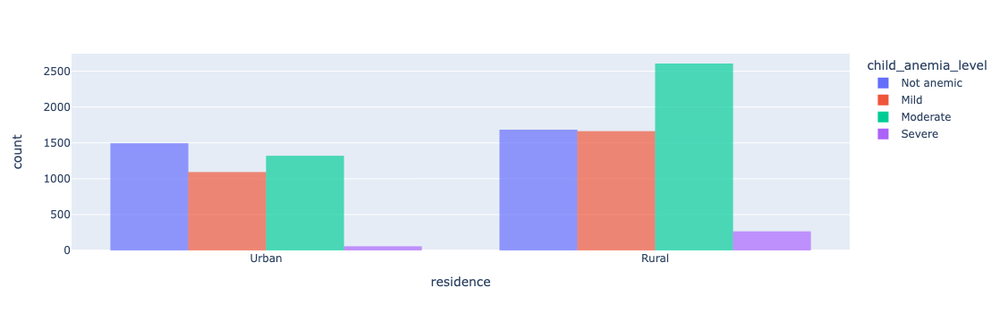

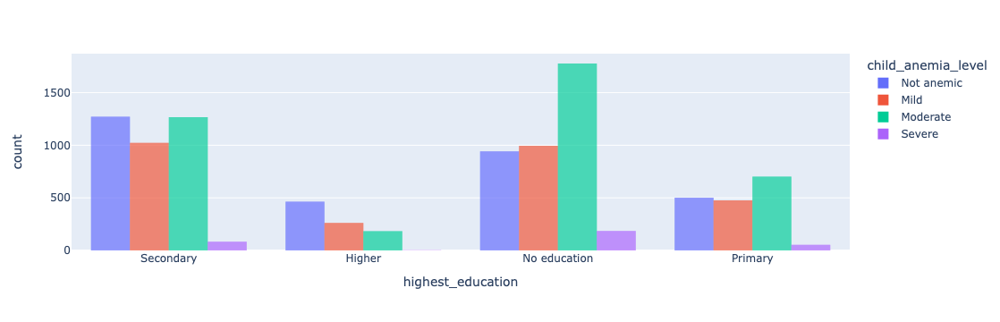

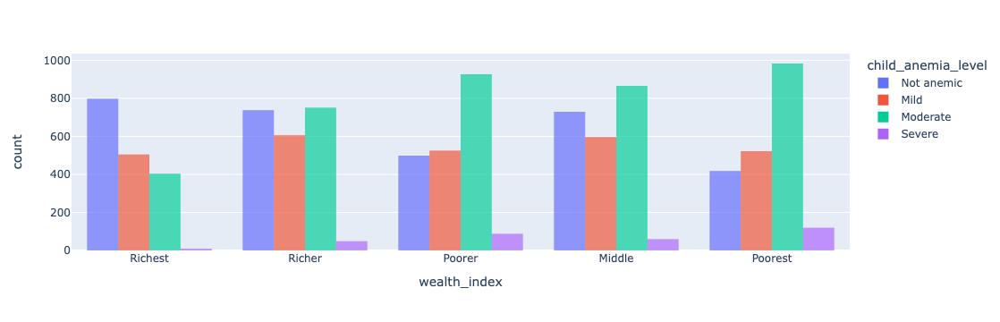

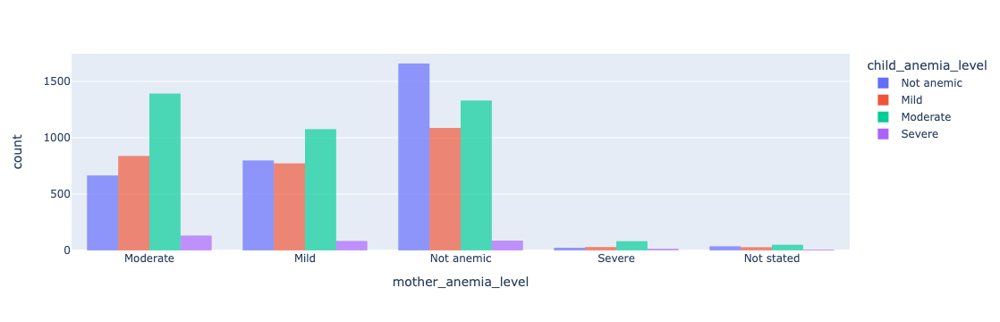

...

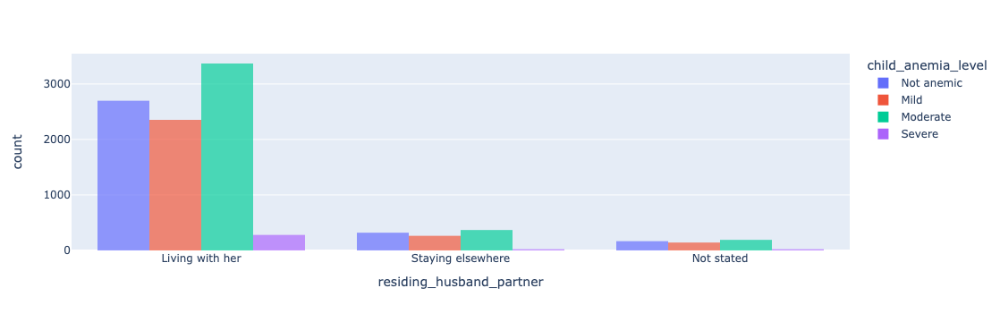

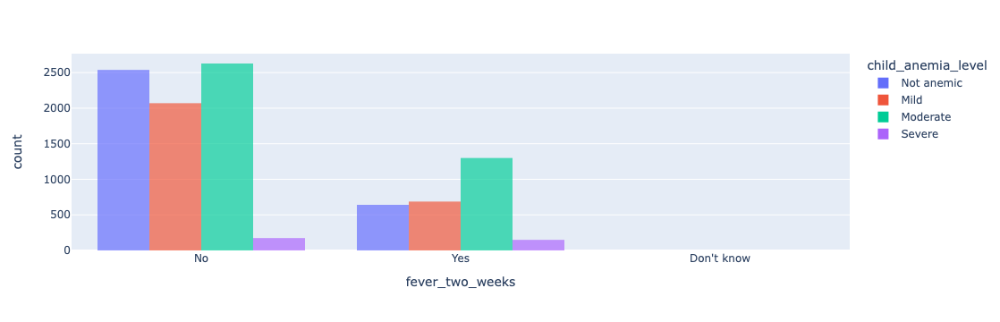

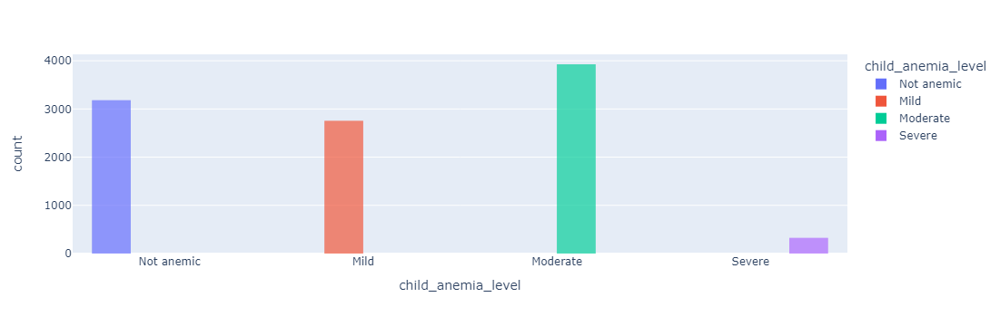

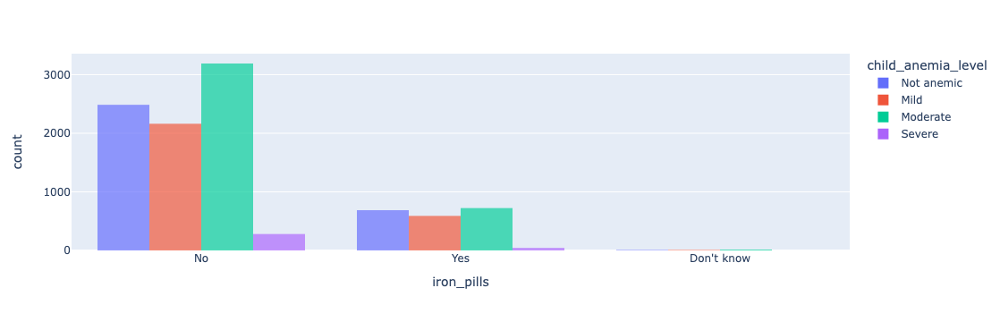

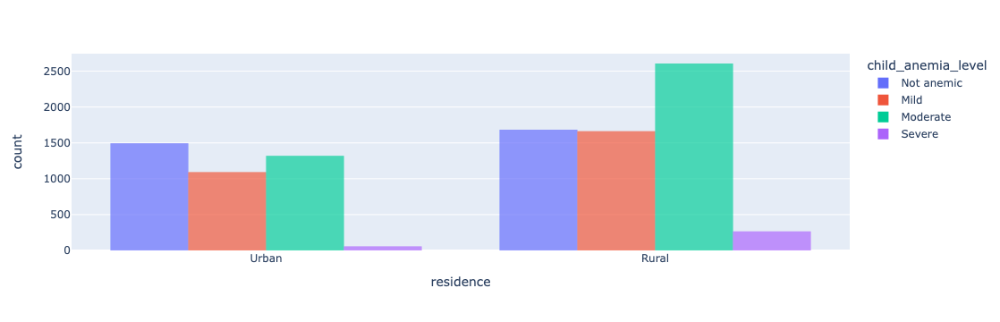

In [37]:
## Trying multiple plots to show distribution of anemia levels and different variables
anemiaFiltered = anemiaData.drop(['births_last5_years', 'age_respondent_1st_birth', 'hemoglobin_altitude_smoking', 'hemoglobin_altitude'], axis='columns')
for column in anemiaFiltered:
    fig2 = px.bar(anemiaFiltered, x=column, color = "child_anemia_level",barmode ="group")
    fig2.update_traces(dict(marker_line_width=0))
    fig2.show()

Image(filename = '/Users/winnie/Downloads/Residence_CA.png')

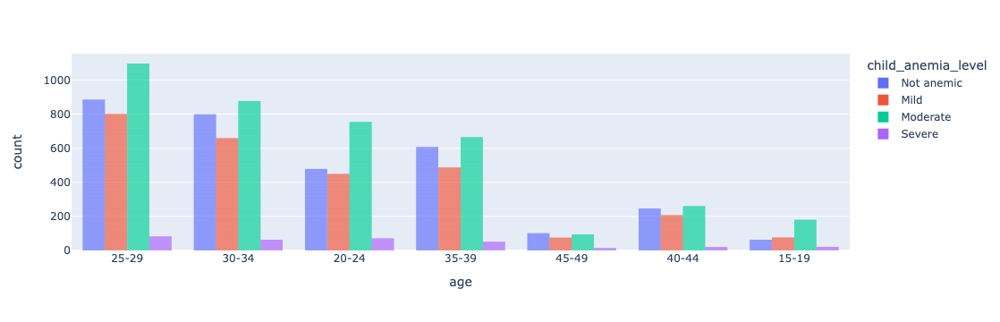

In [38]:
Image(filename = '/Users/winnie/Downloads/age.png')

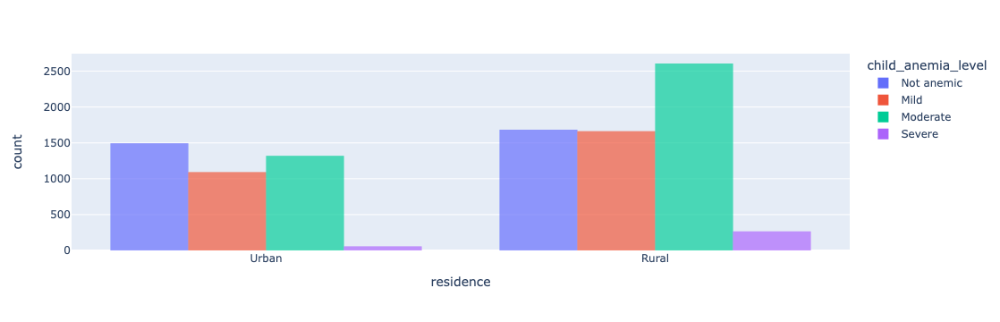

In [39]:
Image(filename = '/Users/winnie/Downloads/Residence_CA.png')

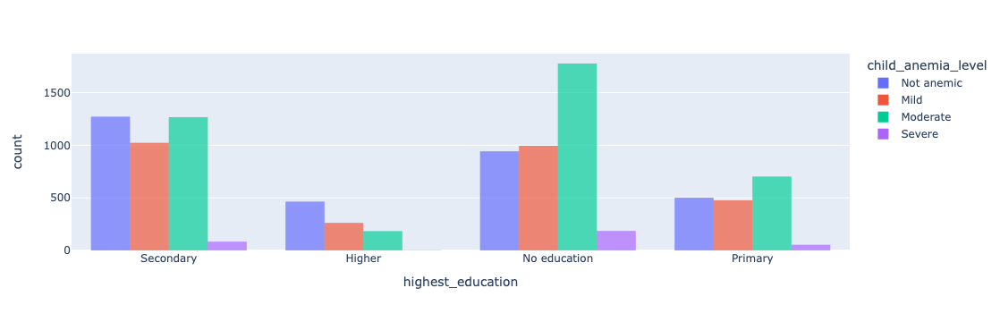

In [40]:
Image(filename = '/Users/winnie/Downloads/education.png')

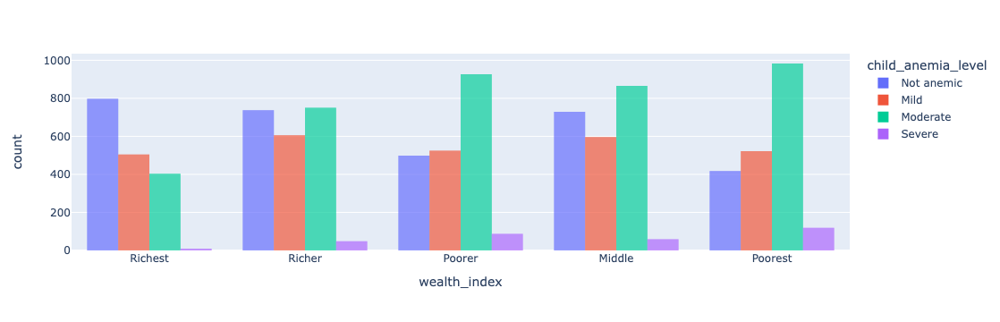

In [41]:
Image(filename = '/Users/winnie/Downloads/Wealth.png')

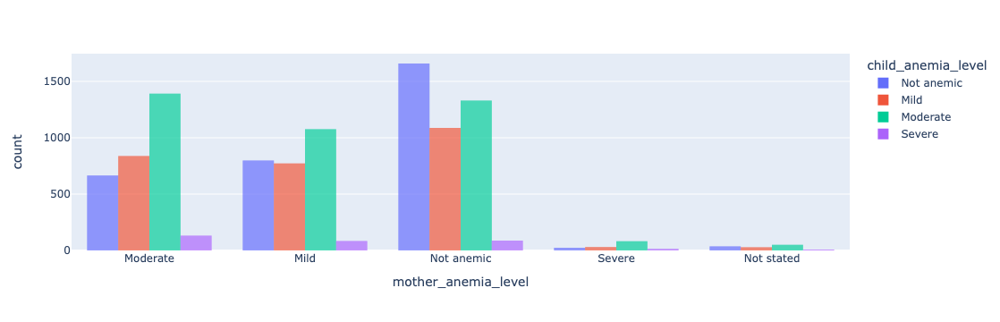

In [42]:
Image(filename = '/Users/winnie/Downloads/mother.png')

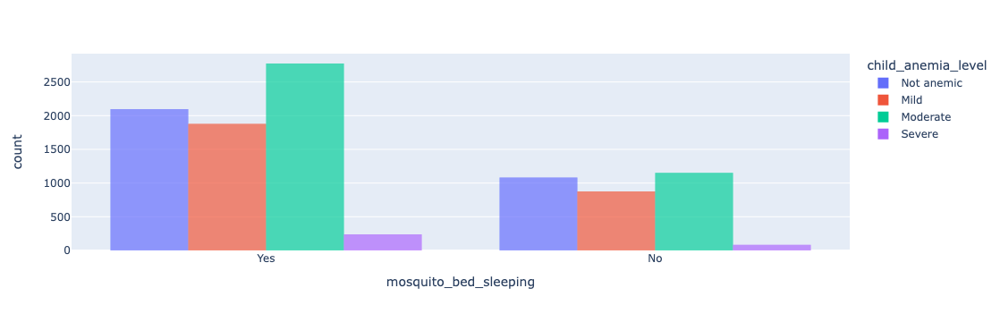

In [43]:
Image(filename = '/Users/winnie/Downloads/mosquito.png')

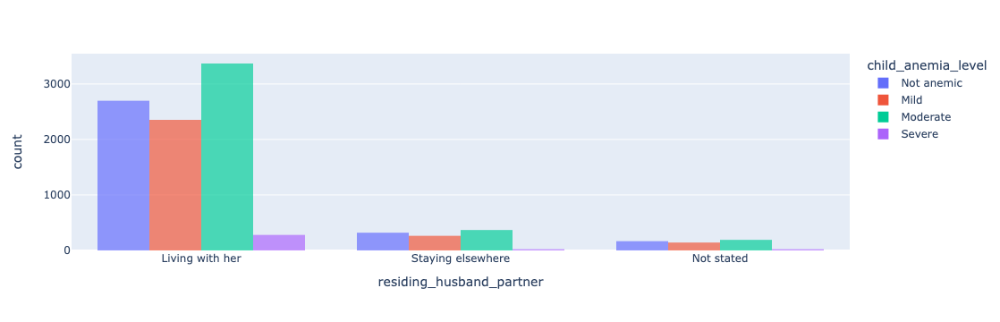

In [44]:
Image(filename = '/Users/winnie/Downloads/residinghusband.png')

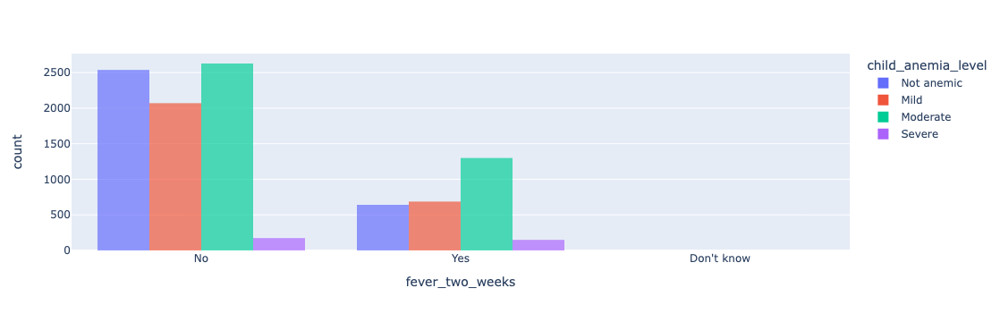

In [27]:
Image(filename = '/Users/winnie/Downloads/fever2weeks.png')

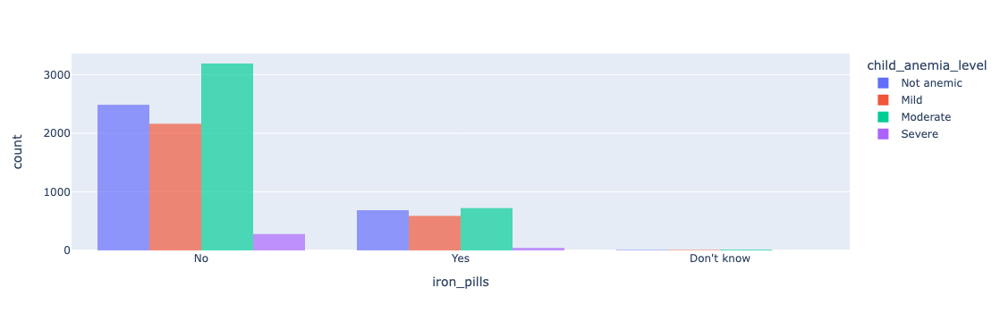

In [45]:
Image(filename = '/Users/winnie/Downloads/ironpills.png')

In [9]:
import statsmodels.graphics.mosaicplot as sp


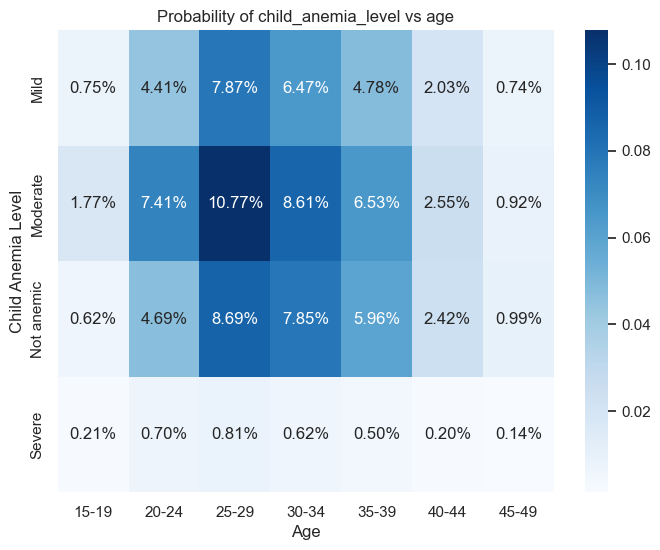

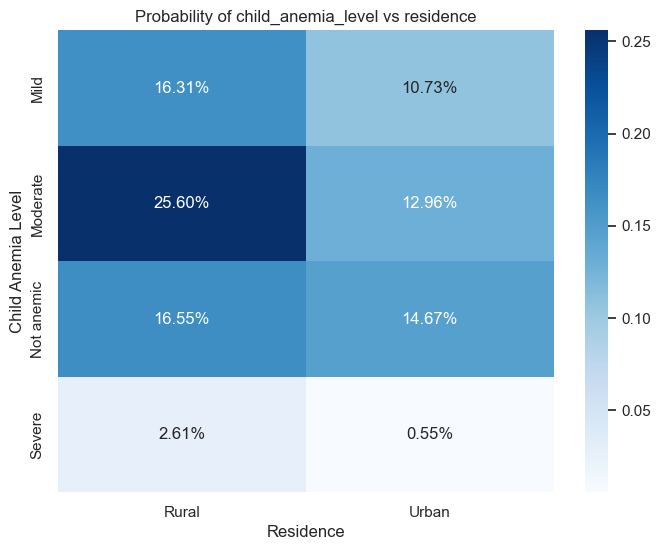

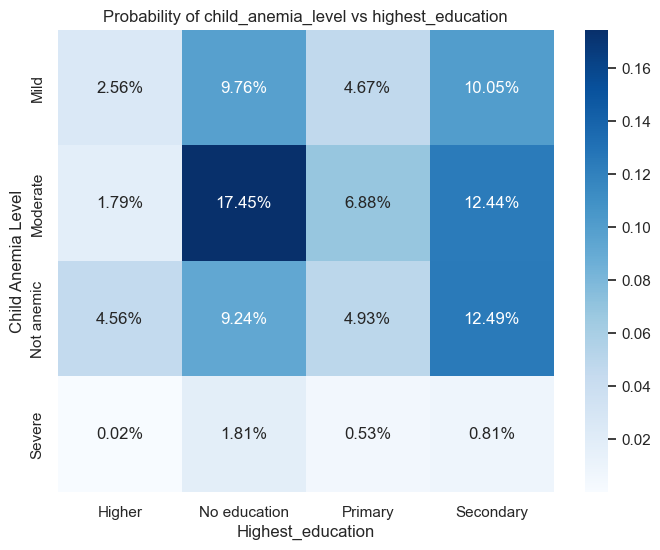

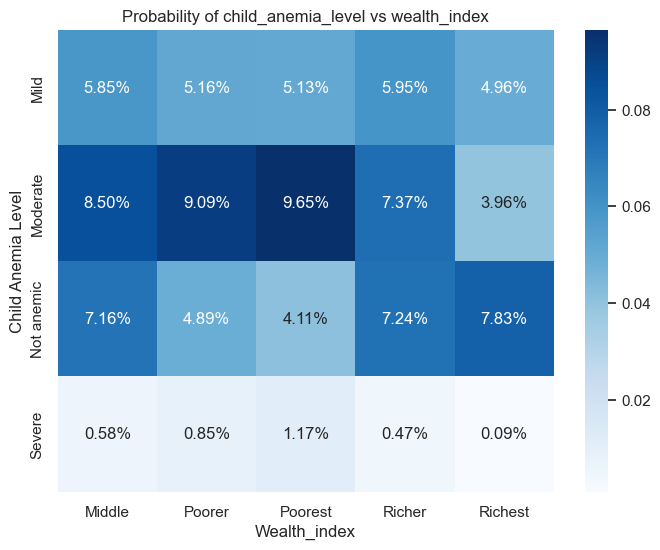

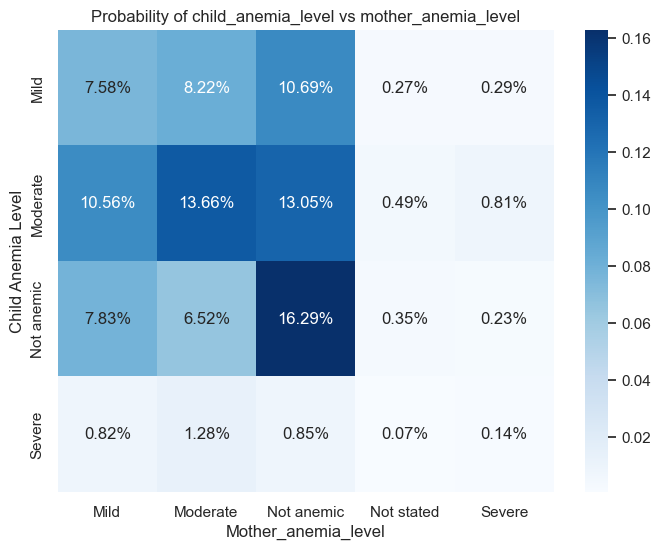

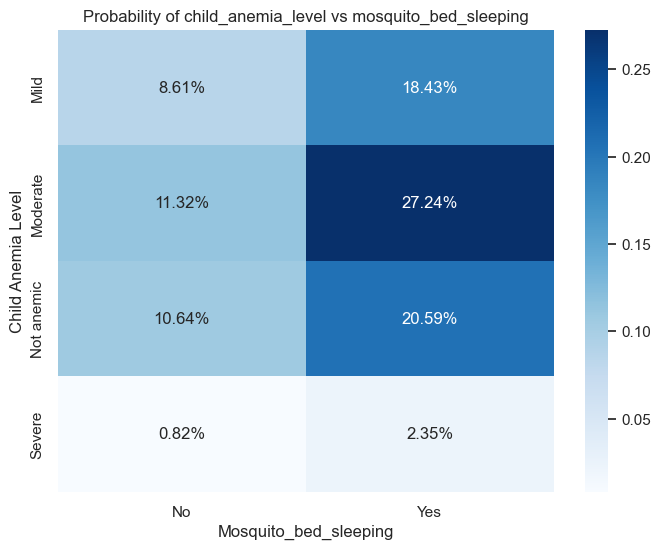

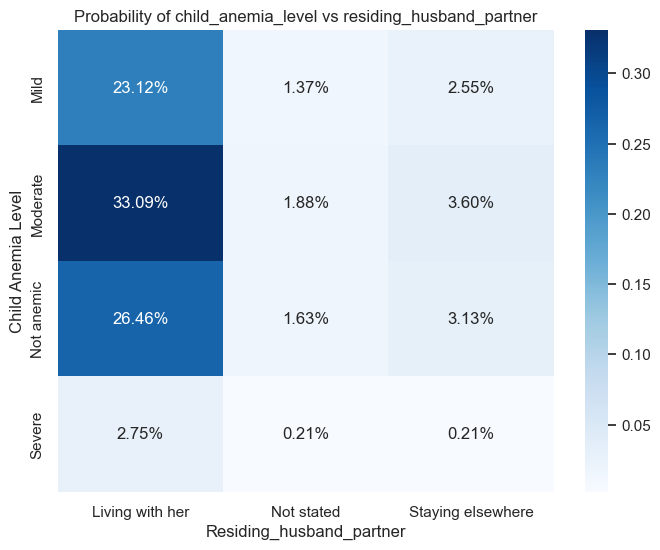

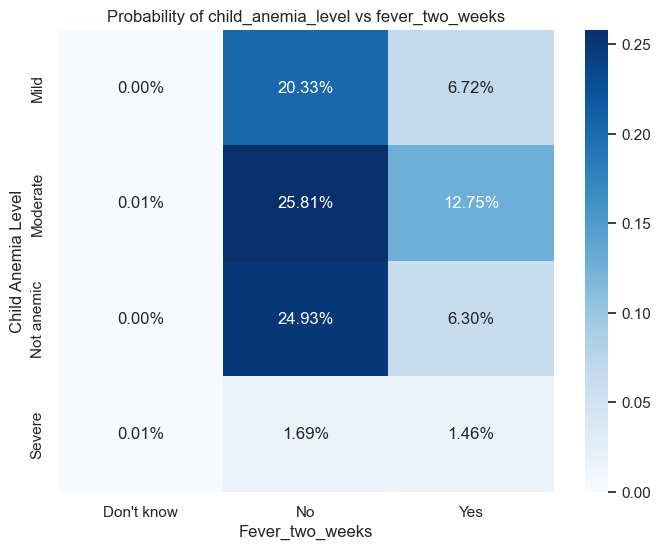

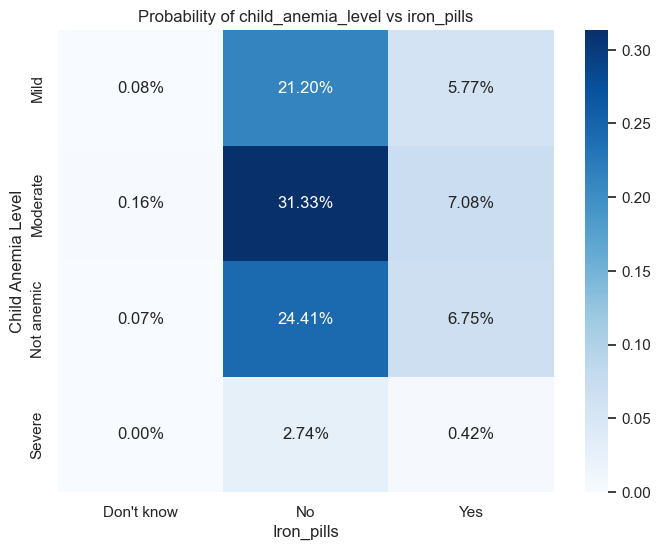

In [10]:
categorical_vars = ['age', 'residence', 'highest_education', 'wealth_index', 
                    'mother_anemia_level', 'mosquito_bed_sleeping', 'residing_husband_partner', 'fever_two_weeks', 
                    'iron_pills']

# Iterate through each categorical variable to create mosaic plots
for var in categorical_vars:
    # Create the contingency table
    contingency_table = pd.crosstab(anemiaData['child_anemia_level'], anemiaData[var])
    
    # Calculate probabilities
    total = contingency_table.sum().sum()
    probabilities = contingency_table / total
    
    # Plot the heatmap with probabilities
    plt.figure(figsize=(8, 6))
    sb.heatmap(probabilities, annot=True, fmt='.2%', cmap='Blues')
    plt.title(f'Probability of child_anemia_level vs {var}')
    plt.xlabel(var.capitalize())
    plt.ylabel('Child Anemia Level')
    plt.show()

#### From the above mosaic plots, we can discern the relationships between individual categorical variables and the child's anemia level. Each mosaic plot visually represents how the child's anemia level varies across different categories of a single variable. 
#### The heatmaps accompanying each plot allow us to quantitatively assess these relationships.This aids in understanding the potential impact of various factors on child anemia levels.